In [1]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np 
import os
import random
import tensorflow as tf
from typing import List, Dict, Tuple


from matplotlib.patches import Rectangle
from sklearn.model_selection import train_test_split

In [2]:
images_pos = os.listdir("../dataset/train/images/pos/")
list_image_pos = []
for image in images_pos:
    list_image_pos.append(f"../dataset/train/images/pos/{image}")
images_neg = os.listdir("../dataset/train/images/neg/")
list_image_neg = []
for image in images_neg:
    list_image_neg.append(f"../dataset/train/images/neg/{image}")
images = list_image_neg + list_image_pos
random.Random(20).shuffle(images)

files = os.listdir("../dataset/train/labels_csv/")
labels = []
for file in files:
    labels.append(file[:-4])
    
df = pd.DataFrame(images, columns=["Image"])
df["label"] = df["Image"].apply(lambda x: 1 if x[25:-4] in labels else 0)
df

,Image,label
0,../dataset/train/images/neg/wangruim_neg_005.jpg,0
1,../dataset/train/images/neg/nivoixpa_neg_007.jpg,0
2,../dataset/train/images/pos/oaitelhi_pos_002.jpg,0
3,../dataset/train/images/pos/amiotnoe_pos_007.jpg,0
4,../dataset/train/images/neg/oaitelhi_neg_001.jpg,0
...,...,...
771,../dataset/train/images/pos/sbenarro_pos_010.jpg,0
772,../dataset/train/images/neg/operezal_neg_002.jpg,0
773,../dataset/train/images/neg/honhuhoa_neg_009.jpg,0
774,../dataset/train/images/pos/smakhlou_pos_002.jpg,0


In [3]:
X_train, X_val, y_train, y_val = train_test_split(df["Image"], df["label"], random_state=15)

In [4]:
X_val.shape

(194,)

In [5]:
def plot_boxes(img, boxes_nms):
     figure, ax = plt.subplots(1, figsize=(10, 10))
     ax.imshow(img)
     for box in boxes_nms:
         rect = Rectangle((box["x"],box["y"]),box["w"],box["h"], edgecolor='r', facecolor="none")
         ax.add_patch(rect)
     plt.show()

In [6]:
def get_IoU(box1: Tuple, box2: Tuple) -> float:
    """Return the Intersection over Union between 2 boxes

    Args:
        box1 (tuple): tuple containing x and y coordinates + width and height of the box 1
        box2 (tuple): tuple containing x and y coordinates + width and height of the box 2

    Returns:
        iou (float): Intersection over Union of the 2 boxes
    """

    x1_1 = box1[0]
    y1_1 = box1[1]
    x1_2 = x1_1 + box1[2]
    y1_2 = y1_1 + box1[3]

    x2_1 = box2[0]
    y2_1 = box2[1]
    x2_2 = x2_1 + box2[2]
    y2_2 = y2_1 + box2[3]

    x_1 = max(x1_1, x2_1)
    x_2 = min(x1_2, x2_2)
    y_1 = max(y1_1, y2_1)
    y_2 = min(y1_2, y2_2)

    intersection_area = max(0, x_2 - x_1) * max(0, y_2 - y_1)
    box1_area = (x1_2 - x1_1) * (y1_2 - y1_1)
    box2_area = (x2_2 - x2_1) * (y2_2 - y2_1)
    iou = intersection_area/(box1_area + box2_area - intersection_area)

    return iou

In [7]:
def load_images_names(pos=True, neg=True) -> pd.DataFrame:
    """Load all images names in order to create train and
    validation data

    Args:
        pos (bool, optional): Include positive images. Defaults to True.
        neg (bool, optional): Include negative images. Defaults to True.

    Returns:
        df (pd.DataFrame): pandas dataframe with all filepathes of positive
            and/or negatives images
    """
    if pos:
        images_pos = os.listdir("../dataset/train/images/pos/")
        list_image_pos = []
        for image in images_pos:
            list_image_pos.append(f"../dataset/train/images/pos/{image}")
    if neg:
        images_neg = os.listdir("../dataset/train/images/neg/")
        list_image_neg = []
        for image in images_neg:
            list_image_neg.append(f"../dataset/train/images/neg/{image}")
    images = list_image_neg + list_image_pos
    random.Random(20).shuffle(images)

    df = pd.DataFrame(images, columns=["Image"])

    return df

In [8]:
def non_max_suppression(output_model: List[Dict], threshold: float, picture_name: str, img: np.array) -> List:
    """Apply Non Max Suppression on a list of boxes in order
    to keep just the better bounding box as a detection

    Args:
        output_model (List[Dict]): list of dictionnaries containing
            boxes coordinates (x, y, w, h) and score of detection
        threshold (float): threshold of IoU: if the box has an IoU
            bigger than the threshold with the better bounding box,
            this box will be removed.
        picture_name (str): Name of the picture considered

    Returns:
        List: _description_
    """
    boxes_output = []
    boxes = output_model.copy()
    while len(boxes) >= 1:
        boxes_used = sorted(boxes, key=lambda x: x["score"], reverse=True)
        best_prediction = boxes_used[0]
        prediction = {}
        prediction["filename"] = f"{picture_name}.jpg"
        prediction.update(best_prediction)
        boxes_output.append(prediction)
        boxes.remove(best_prediction)
        boxes_used.remove(best_prediction)
        for i in range(len(boxes_used)):
            box = boxes_used[i]
            iou = get_IoU(
                (
                    best_prediction["x"],
                    best_prediction["y"],
                    best_prediction["w"],
                    best_prediction["h"]
                ),
                (
                    box["x"],
                    box["y"],
                    box["w"],
                    box["h"]
                )
            )
            if iou > threshold:
                boxes.remove(box)
    plot = np.random.binomial(n=1, p=0.1)
    if plot == 1:
        print("Picture: ", picture_name, ".jpg")
        print("Shape: (", img.shape[0], ", ", img.shape[1], ")")
        plot_boxes(img=img, boxes_nms=boxes_output)
    return boxes_output

In [9]:
def get_image(filepath: str) -> Tuple[np.array, str]:
    """Get the image containing at the filepath

    Args:
        filepath (str): filepath of the image

    Returns:
        Tuple[np.array, str]: image and image name
    """
    img = cv2.imread(filepath)
    picture_name = filepath[16:-4]
    return img, picture_name


In [10]:
def get_selective_search_boxes(image, ss):
    """_summary_

    Args:
        image (np.array): image data
        ss (cv2 object): Selective Segmentation declaration

    Returns:
        ssresults: All the Region of interest returned by the
            Selective Search Segmentation
    """
    ss.setBaseImage(image)
    ss.switchToSelectiveSearchFast()
    ssresults = ss.process()

    return ssresults

In [11]:
def get_vgecocup_output(ssresults, img, classification_model):
    """Get the result of the detection algorithm

    Args:
        ssresults: results of Selective Search Segmentation
        img (str): image name
        classification_model: machine/deep learning model

    Returns:
        model_output: All the bounding boxes of ecocup detected by the
            algorithm
    """
    model_output = []
    imout = img.copy()
    for e, boxes in enumerate(ssresults):
        if e < 3000 or e == len(ssresults):
            x_result, y_result, w_result, h_result = boxes
            if h_result > 0.1*imout.shape[0] and w_result > 0.1*imout.shape[1]:
                test_image = imout[y_result:y_result +
                                   h_result, x_result:x_result+h_result]
                resized = cv2.resize(test_image, (224, 224),
                                     interpolation=cv2.INTER_AREA)
                input_model = np.expand_dims(resized, axis=0)
                classification_model_result = classification_model.predict(
                    input_model, verbose=0)
                if classification_model_result[0][1] > 0.9:
                    model_output.append(
                        {
                            "x": x_result,
                            "y": y_result,
                            "w": w_result,
                            "h": h_result,
                            "score": classification_model_result[0][1]
                        }
                    )

    return model_output

In [12]:
def flatten(list_of_list):
    """Flatten a list of list of dict

    Args:
        list_of_list (List[List[Dict]]): list of list of dict to flatten

    Returns:
        (List[Dict]): input list flattened
    """
    return [dict_obtain for list_of_dict in list_of_list for dict_obtain in list_of_dict]

In [13]:
vgecocup = tf.keras.models.load_model("../models/vgecocup_version2")
vgecocup.summary()

2022-06-18 18:36:16.588187: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

Picture:  /images/neg/durandoc_neg_002 .jpg
Shape: ( 640 ,  480 )


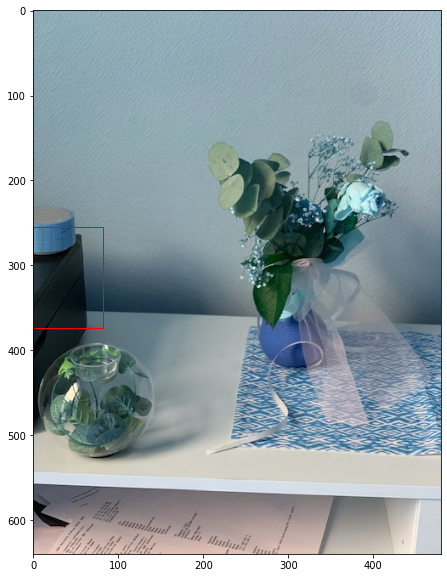

Picture:  /images/pos/maurinde_pos_001 .jpg
Shape: ( 960 ,  720 )


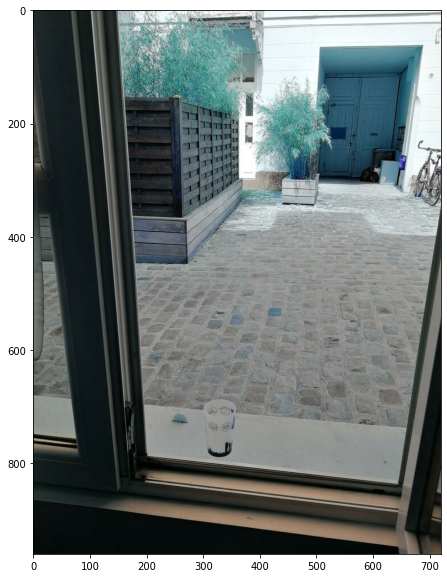

Picture:  /images/pos/olahnech_pos_001 .jpg
Shape: ( 4032 ,  3024 )


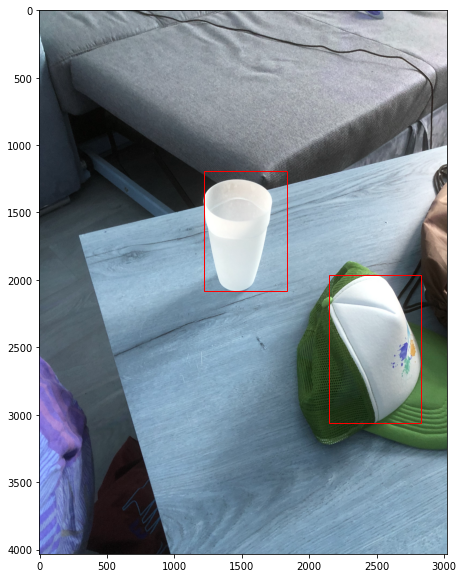

Picture:  /images/neg/shiyujie_neg_001 .jpg
Shape: ( 4032 ,  3024 )


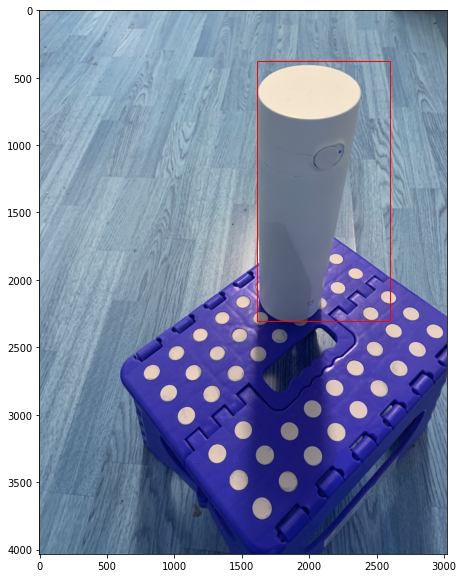

Picture:  /images/neg/maurinde_neg_005 .jpg
Shape: ( 720 ,  960 )


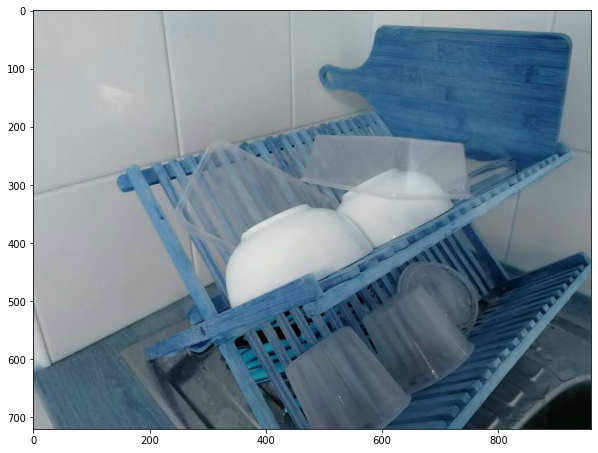

Picture:  /images/pos/bmissaou_pos_001 .jpg
Shape: ( 800 ,  600 )


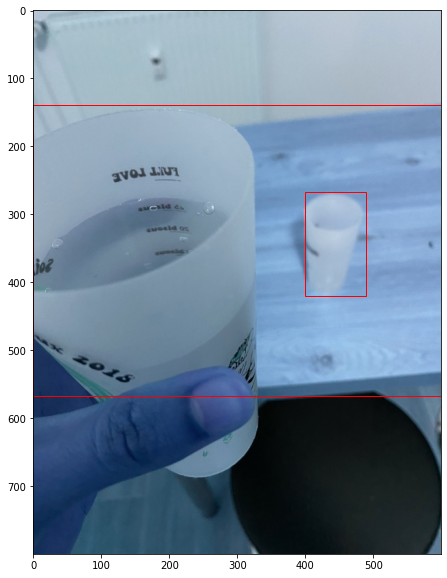

Picture:  /images/pos/gralljea_pos_003 .jpg
Shape: ( 1150 ,  863 )


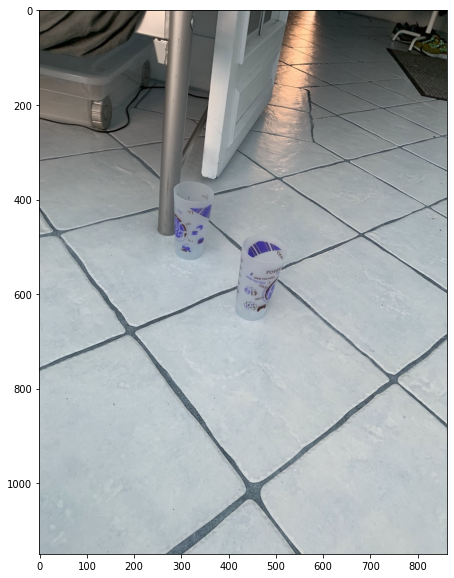

Picture:  /images/neg/oaitelhi_neg_002 .jpg
Shape: ( 1385 ,  780 )


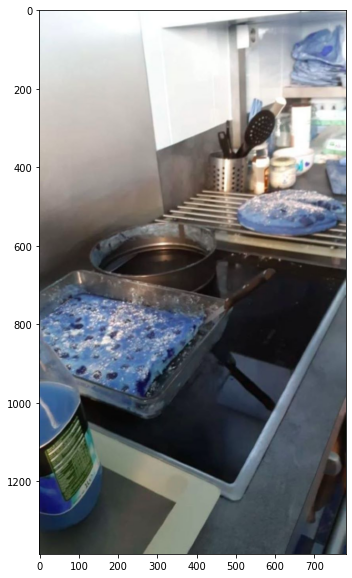

Picture:  /images/neg/eambrois_neg_007 .jpg
Shape: ( 960 ,  1280 )


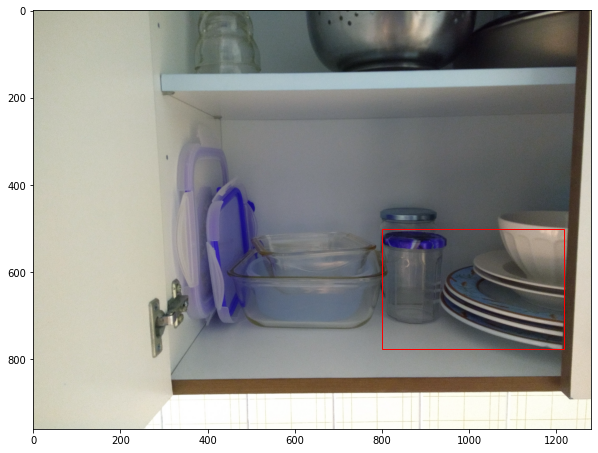

Picture:  /images/pos/hoxuanvi_pos_004 .jpg
Shape: ( 4000 ,  2992 )


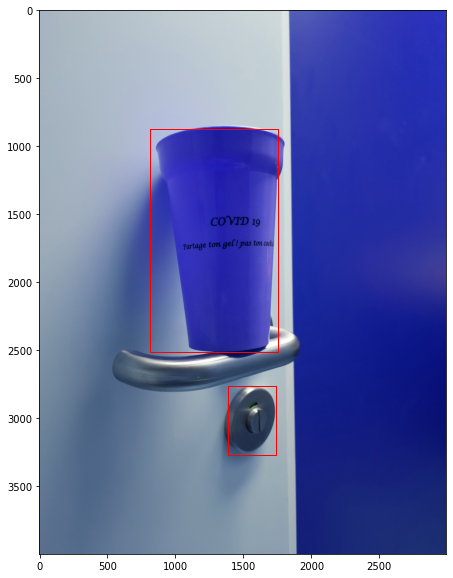

Picture:  /images/pos/vivatben_pos_003 .jpg
Shape: ( 800 ,  600 )


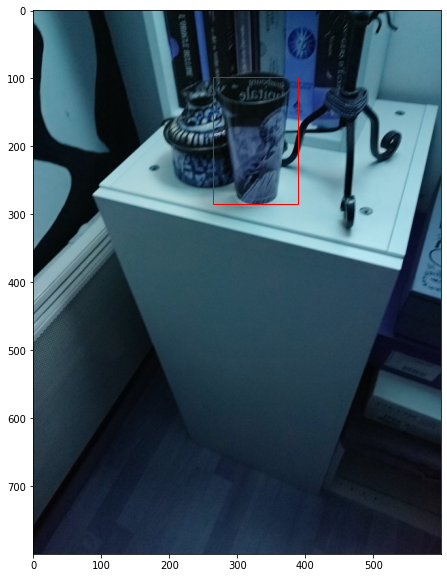

Picture:  /images/neg/wahartlo_neg_008 .jpg
Shape: ( 2822 ,  2116 )


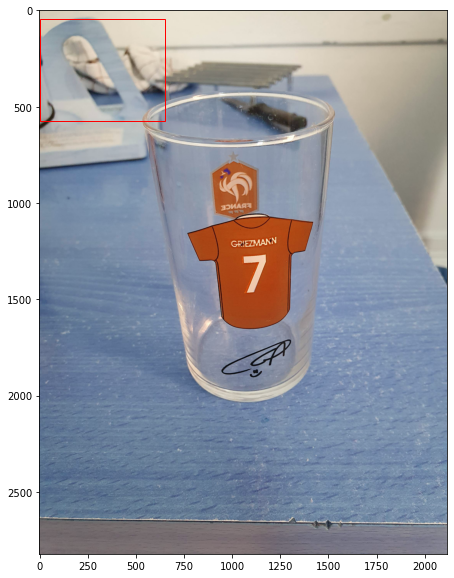

Picture:  /images/neg/cebertra_neg_005 .jpg
Shape: ( 1000 ,  750 )


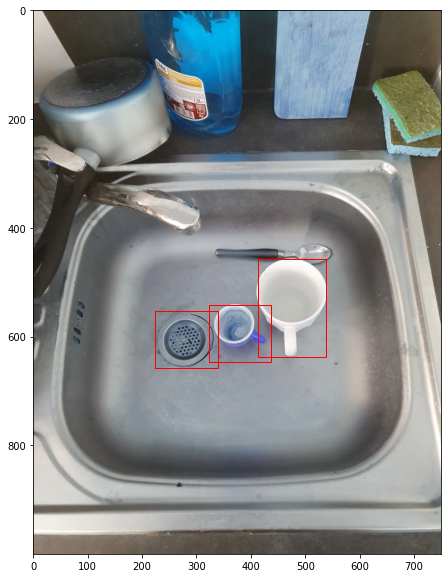

Picture:  /images/neg/zitolilo_neg_006 .jpg
Shape: ( 1000 ,  750 )


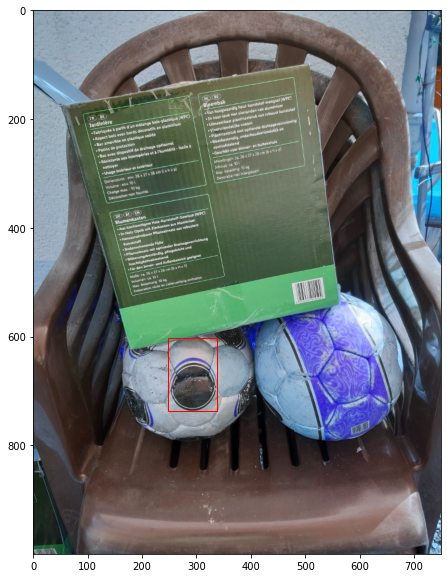

Picture:  /images/pos/andrerom_pos_004 .jpg
Shape: ( 750 ,  1000 )


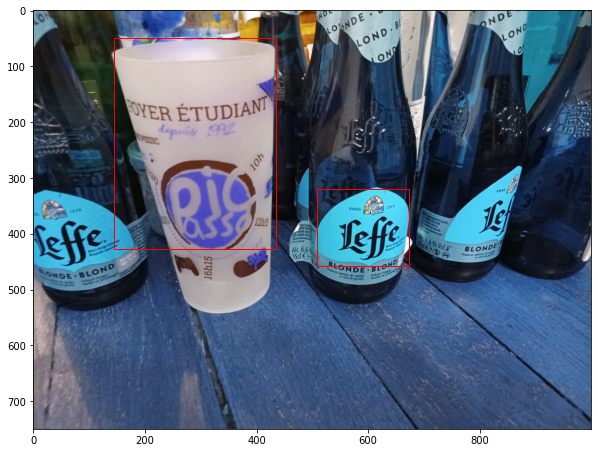

Picture:  /images/pos/ljeannea_pos_007 .jpg
Shape: ( 1000 ,  1000 )


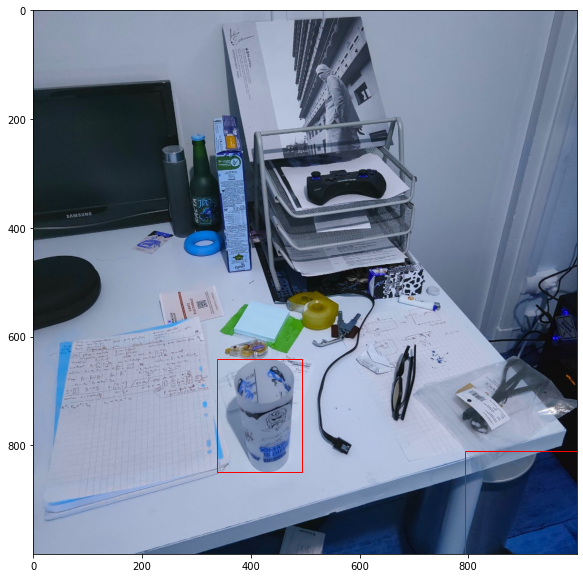

Picture:  /images/neg/amagnero_neg_001 .jpg
Shape: ( 756 ,  1008 )


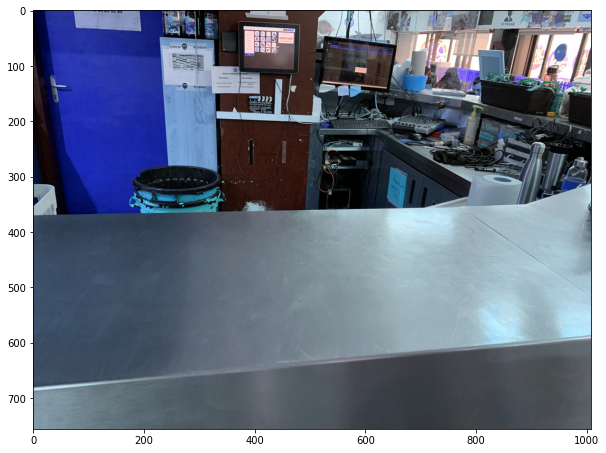

Picture:  /images/pos/pointaug_pos_002 .jpg
Shape: ( 1349 ,  1798 )


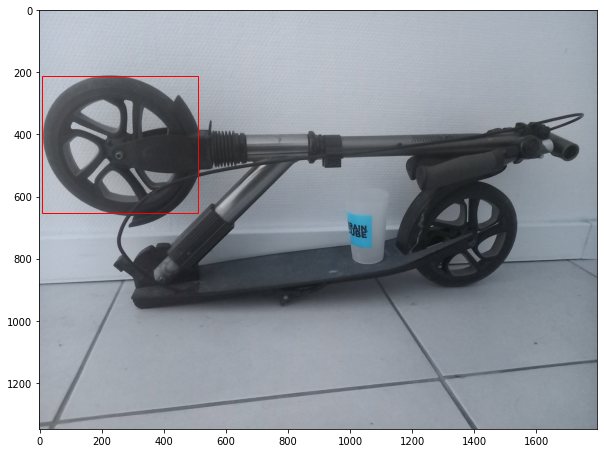

Picture:  /images/neg/nivoixpa_neg_003 .jpg
Shape: ( 443 ,  591 )


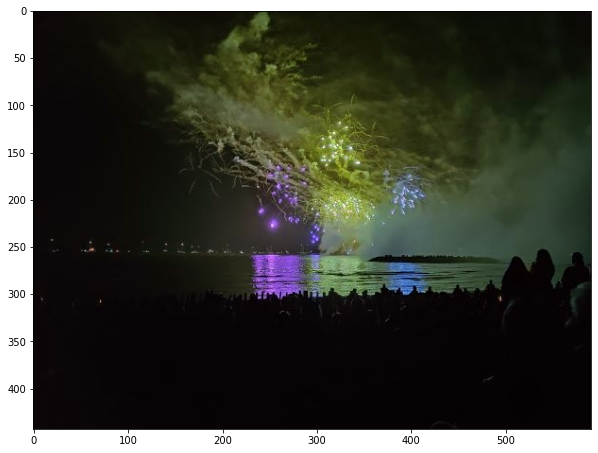

Picture:  /images/pos/smakhlou_pos_001 .jpg
Shape: ( 4032 ,  3024 )


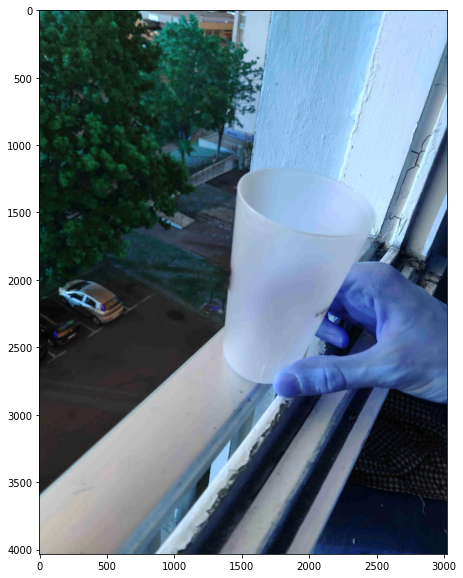

Picture:  /images/neg/jangthom_neg_001 .jpg
Shape: ( 1109 ,  831 )


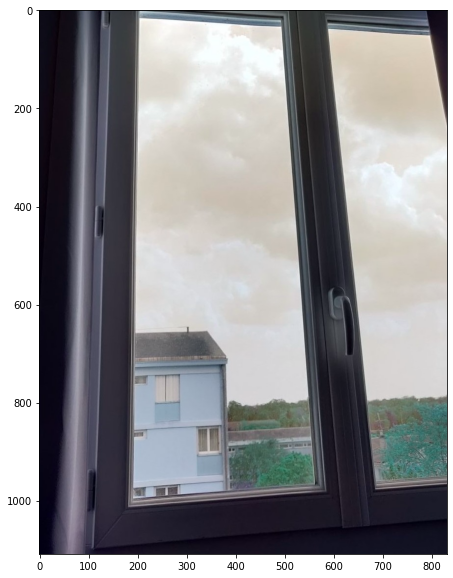

Picture:  /images/pos/mparache_pos_006 .jpg
Shape: ( 4608 ,  3456 )


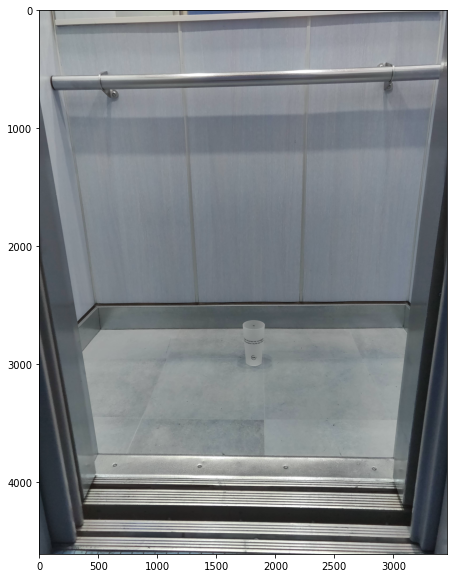

Picture:  /images/pos/ngthithu_pos_008 .jpg
Shape: ( 999 ,  999 )


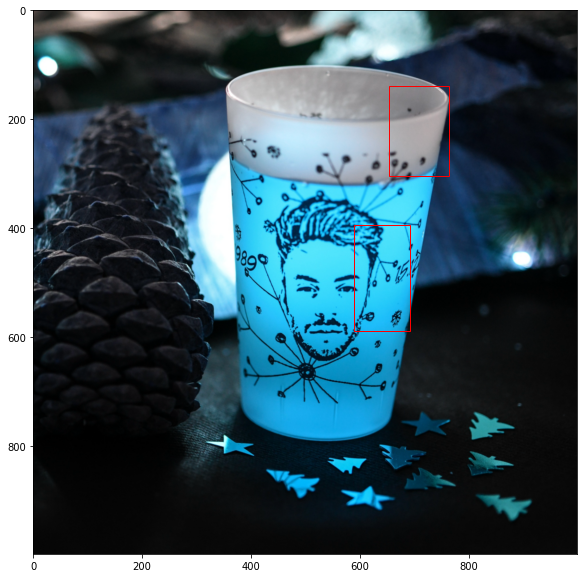

Picture:  /images/pos/amiotnoe_pos_007 .jpg
Shape: ( 1264 ,  711 )


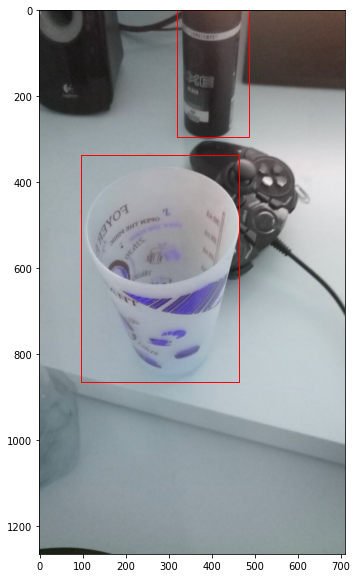

Picture:  /images/pos/andrerom_pos_002 .jpg
Shape: ( 750 ,  1000 )


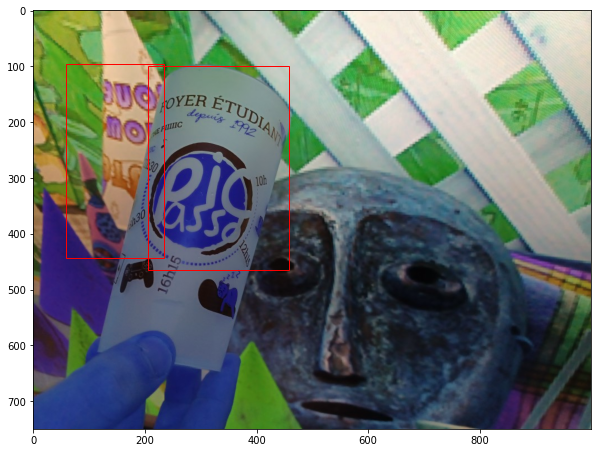

Picture:  /images/pos/maxvaill_pos_002 .jpg
Shape: ( 1080 ,  810 )


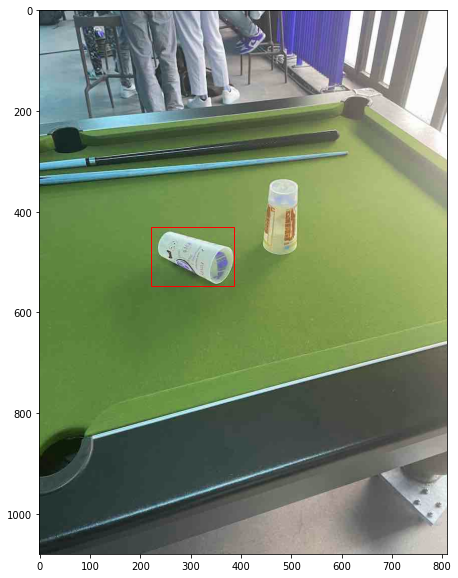

Picture:  /images/pos/pointaug_pos_003 .jpg
Shape: ( 1940 ,  1455 )


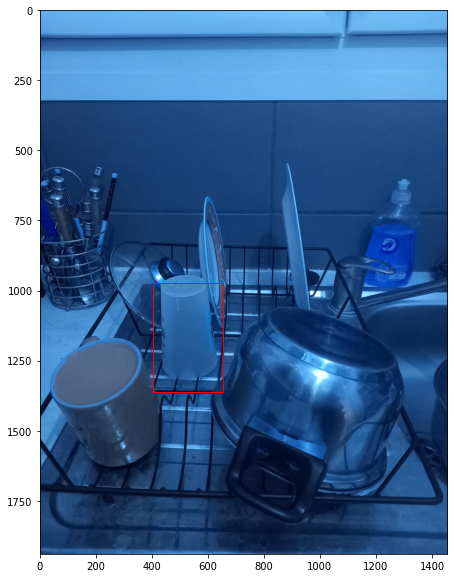

Picture:  /images/neg/detreear_neg_001 .jpg
Shape: ( 750 ,  1000 )


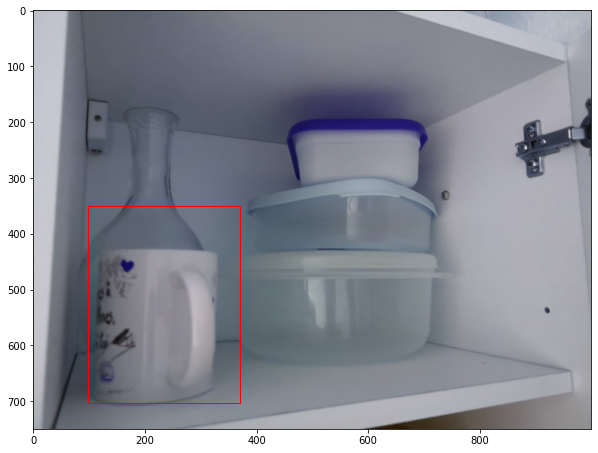

Picture:  /images/pos/maxvaill_pos_009 .jpg
Shape: ( 1080 ,  810 )


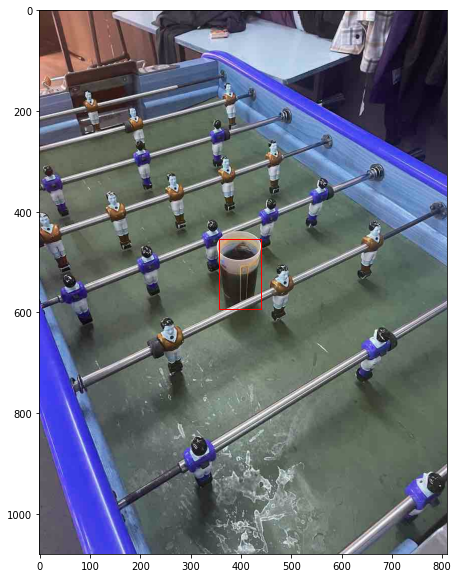

Picture:  /images/neg/guozihen_neg_001 .jpg
Shape: ( 3024 ,  4032 )


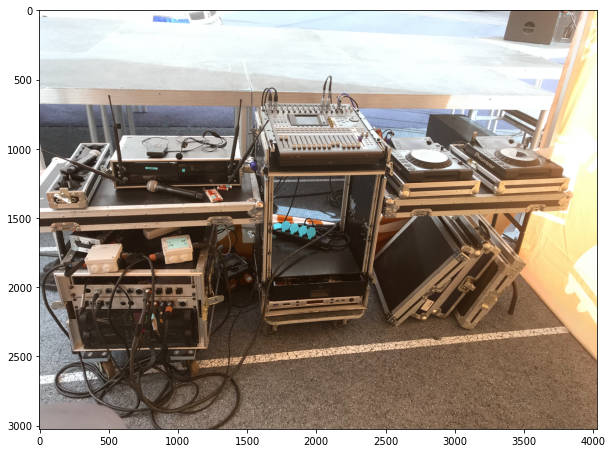

Picture:  /images/neg/shiyujie_neg_004 .jpg
Shape: ( 3024 ,  4032 )


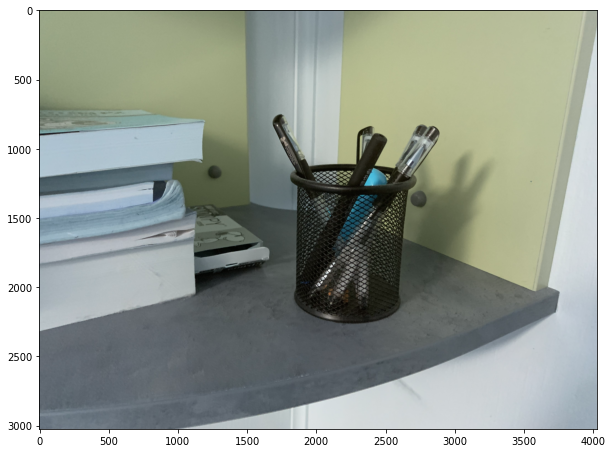

In [15]:
filepathes_validation = list(X_val)
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
final_output = []
for filepath in filepathes_validation:
    img, picture_name = get_image(filepath)
    ssresults = get_selective_search_boxes(img, ss)
    model_output = get_vgecocup_output(ssresults, img, vgecocup)
    model_output_nms = non_max_suppression(model_output, 0.1, picture_name, img)
    final_output.append(model_output_nms)

In [18]:
def flatten(list_of_list):
    """Flatten a list of list of dict

    Args:
        list_of_list (List[List[Dict]]): list of list of dict to flatten

    Returns:
        (List[Dict]): input list flattened
    """
    return [dict_obtain for list_of_dict in list_of_list for dict_obtain in list_of_dict]

final_output_flattened = flatten(final_output)

In [37]:
labels_true = []
for filepath in X_val:
    if "pos" in filepath:
        try:
            df = pd.read_csv(f"../dataset/train/labels_csv/{filepath[28:-4]}.csv", header=None)
            df.columns = ["y", "x", "h", "w", "difficulty"]
            df["filename"] = f"{filepath[28:-4]}.jpg"
            df = df[["filename", "y", "x", "h", "w", "difficulty"]]
            labels_true.append(df.to_dict("records"))
        except:
            print(f"File {filepath[28:-4]}.csv doesn't exist")

File cebertra_pos_007.csv doesn't exist


In [74]:
labels_true = flatten(labels_true)

In [59]:
def get_metrics(y_true, y_pred):
    y_true_list = y_true.copy()
    y_pred_list = y_pred.copy()
    good_detection = 0
    for detection in y_pred_list:
        for real_ecocup in y_true_list:
            if detection["filename"][12:] == real_ecocup["filename"]:
                iou = get_IoU(
                    (
                        detection["x"],
                        detection["y"],
                        detection["w"],
                        detection["h"]
                    ),
                    (
                        real_ecocup["x"],
                        real_ecocup["y"],
                        real_ecocup["w"],
                        real_ecocup["h"]
                    )
                )
                if iou >= 0.5:
                    good_detection += 1
                    y_true_list.remove(real_ecocup)
                    y_pred_list.remove(detection)
    
    return good_detection

In [60]:
get_metrics(labels_true, final_output_flattened)

62

In [61]:
print(len(labels_true))

191


In [62]:
print(len(final_output_flattened))

217


In [69]:
metrics = pd.DataFrame(
    {"No ecocup": [0, 155], "ecocup": [129, 62]},
)
metrics.index = ["No ecocup", "ecocup"]
metrics

,No ecocup,ecocup
No ecocup,0,129
ecocup,155,62


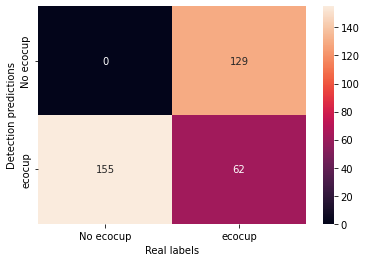

In [73]:
import seaborn as sns

sns.heatmap(metrics, annot=True, fmt="d")
plt.ylabel("Detection predictions")
plt.xlabel("Real labels")
plt.show()